<a href="https://colab.research.google.com/github/mikohuhu/MMAI_NLP/blob/main/NLP_Capstone_Project_P1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Packages

In [ ]:
import pandas as pd
import numpy as np
import re
import string
from bs4 import BeautifulSoup
from sklearn.feature_extraction.text import TfidfVectorizer, ENGLISH_STOP_WORDS as stop_words
from nltk.stem import WordNetLemmatizer
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')
from sklearn.model_selection import train_test_split, cross_val_score, RepeatedKFold, ShuffleSplit
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.pipeline import Pipeline
import openpyxl
from sklearn.multioutput import MultiOutputClassifier
import warnings
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Embedding, GlobalAveragePooling1D, concatenate
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from collections import Counter
from sklearn.metrics import confusion_matrix, f1_score

warnings.filterwarnings('ignore')

[nltk_data] Downloading package wordnet to /Users/siyuwo/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/siyuwo/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


# Step 1: Read Excel File

In [ ]:
file_path = 'Input/SoF Q1-Q4 2018-2021 Comments - coded.xlsx'
excel_data = pd.ExcelFile(file_path)

# Define tabs to exclude
exclude_tabs = ['Master List Codes', 'Master Verbatim']

# Read the data from each tab except the excluded ones
data_frames = []
for sheet in excel_data.sheet_names:
    if sheet not in exclude_tabs:
        df = pd.read_excel(file_path, sheet_name=sheet)
        # Rename column C to 'Comment'
        if len(df.columns) > 2:
            df.rename(columns={df.columns[2]: 'Comment'}, inplace=True)
        # Keep only the required columns if they exist - Broad Code 1' and 'Sub Code 1'
        cols = df.columns
        if 'Comment' in cols and 'Broad Code 1' in cols and 'Sub Code 1' in cols:
            df = df[['Comment', 'Broad Code 1', 'Sub Code 1']]
            # Keep the sheet name to the input data
            df['tab name'] = sheet
            data_frames.append(df)

# Concatenate all data frames into one
result_df = pd.concat(data_frames, ignore_index=True)
result_df = result_df[['tab name', 'Comment', 'Broad Code 1', 'Sub Code 1']]

# Step 2: Text/Data Cleansing

In [ ]:
# Only keep rows that have values in both 'Comment' and 'Broad Code 1' columns
df = result_df.dropna(subset=['Comment', 'Broad Code 1'])

# Step 2: Data cleaning for the 'Comment' column
lemmatizer = WordNetLemmatizer()
def clean_comment(comment):
    # Remove HTML tags
    comment = BeautifulSoup(comment, "html.parser").get_text()
    # Case standardization
    comment = comment.lower()
    # Remove URLs
    comment = re.sub(r'http\S+|www\S+|https\S+', '', comment, flags=re.MULTILINE)
    # Remove special characters, mentions, hashtags, and digits
    comment = re.sub(r'\@\w+|\#|\d+', '', comment)
    # Remove punctuation
    comment = comment.translate(str.maketrans('', '', string.punctuation))
    # Tokenize and lemmatize
    comment = comment.split()
    comment = [lemmatizer.lemmatize(word) for word in comment if word not in stop_words]
    # Join the cleaned words back into a single string
    comment = ' '.join(comment)
    return comment

df['Comment'] = df['Comment'].apply(clean_comment)
df.head()

,tab name,Comment,Broad Code 1,Sub Code 1
0,Client Services,blessed strong ays support heather wonderful h...,4.0,422.0
11,Client Services,human error take place feel like transaction m...,4.0,442.0
12,Client Services,ays amazing head office processing inaccurate ...,4.0,422.0
16,Client Services,accountability whatsoever contact centre frust...,17.0,1700.0
19,Client Services,weekend wait time help desk poor tech availabl...,5.0,503.0


In [ ]:
# Export the result_df to an Excel file
output_file_path = 'Output/cleaned_df.xlsx'
df.to_excel(output_file_path, index=False)

# Step 3: EDA

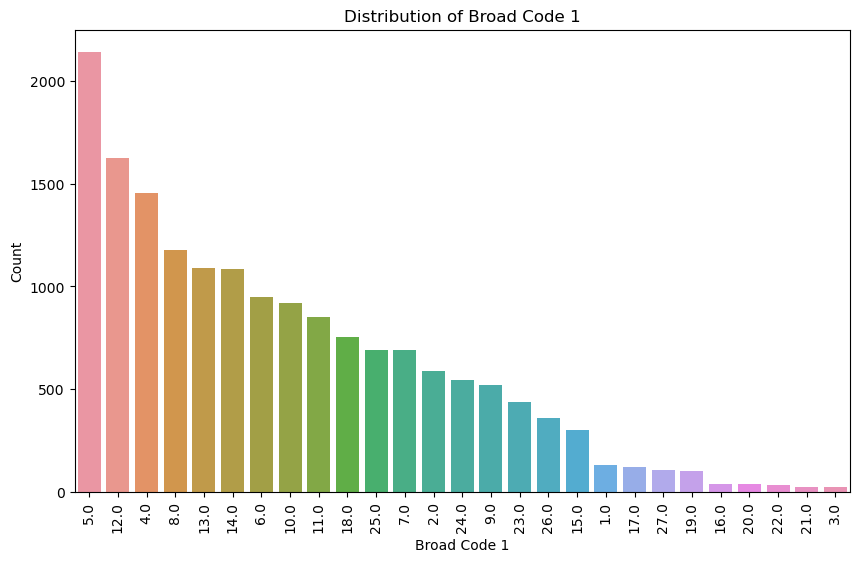

In [ ]:
# Distribution of Broad Code 1
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Broad Code 1', order=df['Broad Code 1'].value_counts().index)
plt.title('Distribution of Broad Code 1')
plt.xlabel('Broad Code 1')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

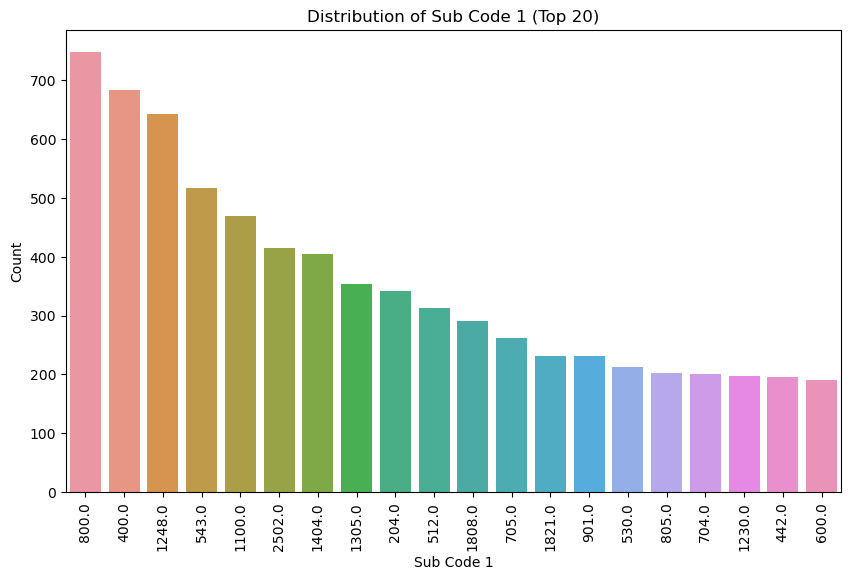

In [ ]:
# Distribution of Sub Code 1 (Top 20)
top_20_sub_code_1 = df['Sub Code 1'].value_counts().nlargest(20).index
plt.figure(figsize=(10, 6))
sns.countplot(data=df[df['Sub Code 1'].isin(top_20_sub_code_1)], x='Sub Code 1', order=top_20_sub_code_1)
plt.title('Distribution of Sub Code 1 (Top 20)')
plt.xlabel('Sub Code 1')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

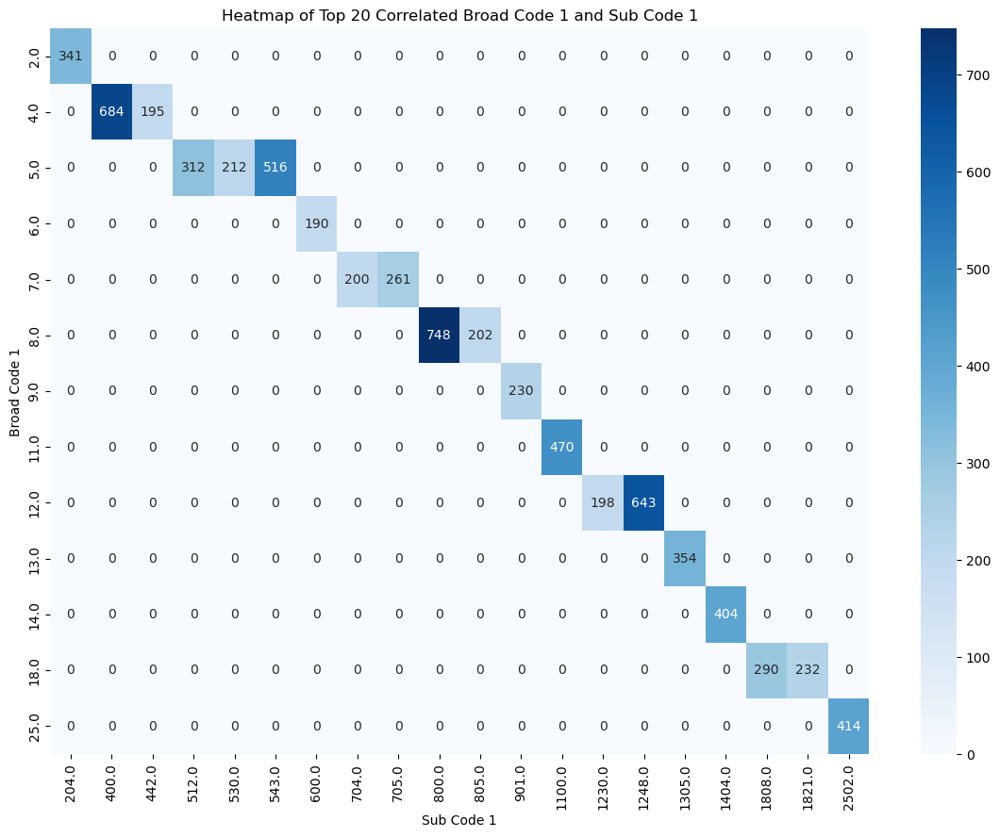

In [ ]:
# Relationship between Broad Code 1 and Sub Code 1 (Top 20 Correlated)
crosstab = pd.crosstab(df['Broad Code 1'], df['Sub Code 1'])
crosstab_flat = crosstab.unstack().reset_index()
crosstab_flat.columns = ['Sub Code 1', 'Broad Code 1', 'count']
top_20_pairs = crosstab_flat.nlargest(20, 'count')

# Pivot the top 20 pairs back to a matrix form for the heatmap
top_20_crosstab = top_20_pairs.pivot('Broad Code 1', 'Sub Code 1', 'count').fillna(0)

plt.figure(figsize=(14, 10))
sns.heatmap(top_20_crosstab, cmap='Blues', annot=True, fmt='g')  # Use 'g' for general format to handle floats
plt.title('Heatmap of Top 20 Correlated Broad Code 1 and Sub Code 1')
plt.xlabel('Sub Code 1')
plt.ylabel('Broad Code 1')
plt.show()

In [ ]:
# Function to get top words
def get_top_words(text, n=10):
    words = ' '.join(text).split()
    word_counts = Counter(words)
    return word_counts.most_common(n)

# Get top words for Broad Code 1
broad_code_1_top_words = df.groupby('Broad Code 1')['Comment'].apply(lambda x: get_top_words(x))

# Get top words for Sub Code 1
sub_code_1_top_words = df.groupby('Sub Code 1')['Comment'].apply(lambda x: get_top_words(x))

# Display top words for Broad Code 1
for broad_code, words in broad_code_1_top_words.items():
    print(f"Top words for Broad Code 1 - {broad_code}:")
    print(words)
    print("\n")

# Display top words for Sub Code 1
for sub_code, words in sub_code_1_top_words.items():
    print(f"Top words for Sub Code 1 - {sub_code}:")
    print(words)
    print("\n")

Top words for Broad Code 1 - 1.0:
[('client', 58), ('advertising', 51), ('marketing', 46), ('ig', 46), ('ad', 45), ('national', 43), ('need', 30), ('consultant', 24), ('like', 24), ('company', 23)]


Top words for Broad Code 1 - 2.0:
[('change', 442), ('client', 245), ('consultant', 208), ('ig', 206), ('time', 170), ('year', 149), ('company', 147), ('business', 103), ('new', 102), ('need', 98)]


Top words for Broad Code 1 - 3.0:
[('client', 37), ('ig', 23), ('product', 9), ('consultant', 8), ('need', 7), ('time', 6), ('lot', 6), ('service', 6), ('business', 6), ('better', 6)]


Top words for Broad Code 1 - 4.0:
[('client', 634), ('time', 488), ('service', 357), ('ays', 268), ('need', 250), ('issue', 247), ('answer', 242), ('consultant', 215), ('error', 214), ('processing', 177)]


Top words for Broad Code 1 - 5.0:
[('advantage', 579), ('search', 577), ('time', 481), ('need', 463), ('client', 435), ('ig', 433), ('information', 420), ('technology', 362), ('plus', 318), ('work', 309)]




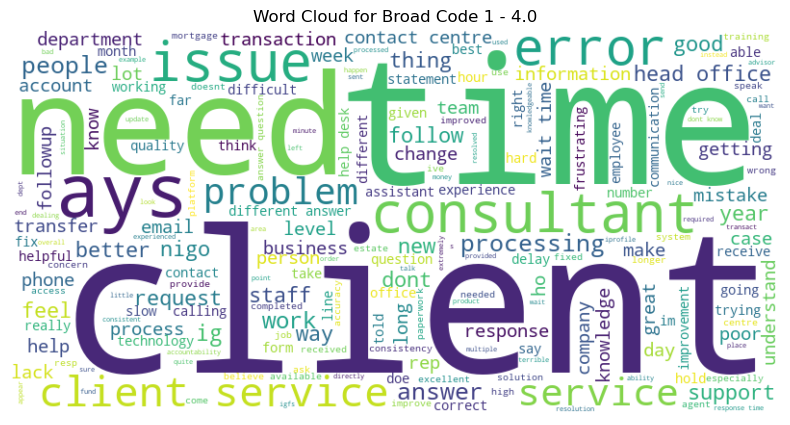

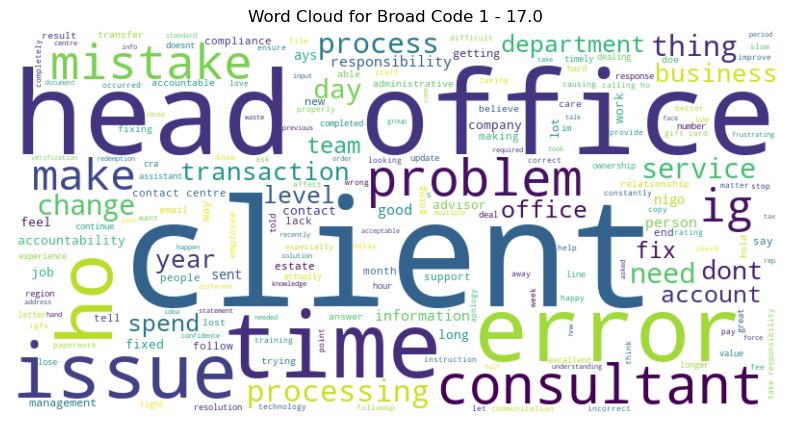

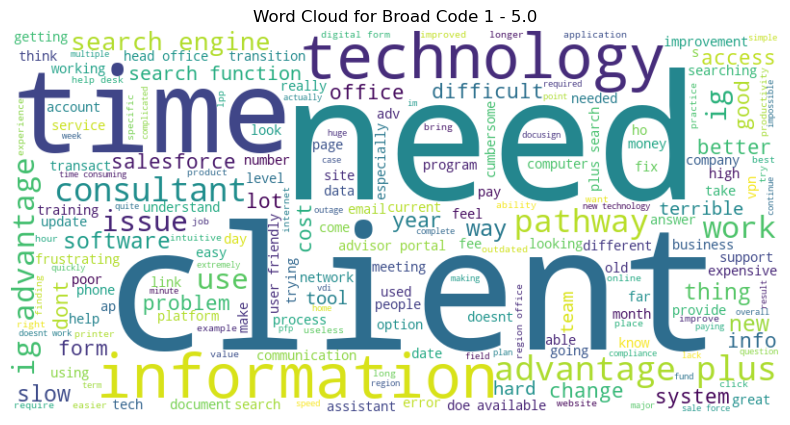

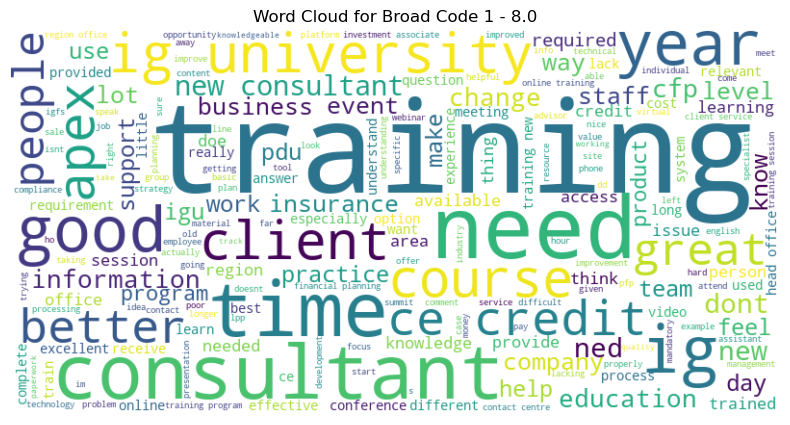

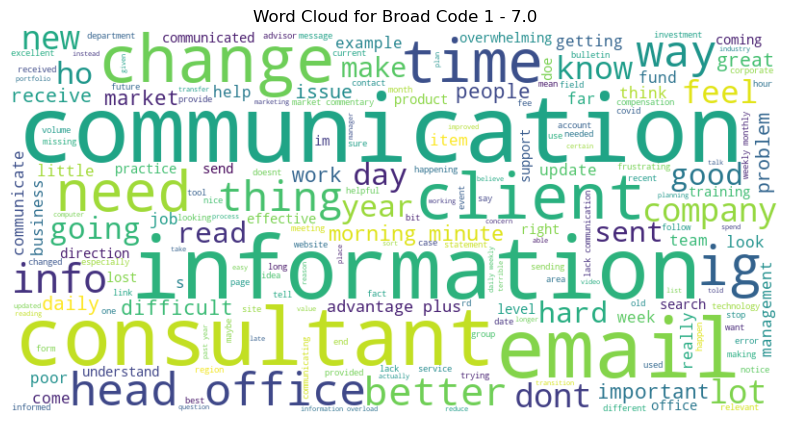

...

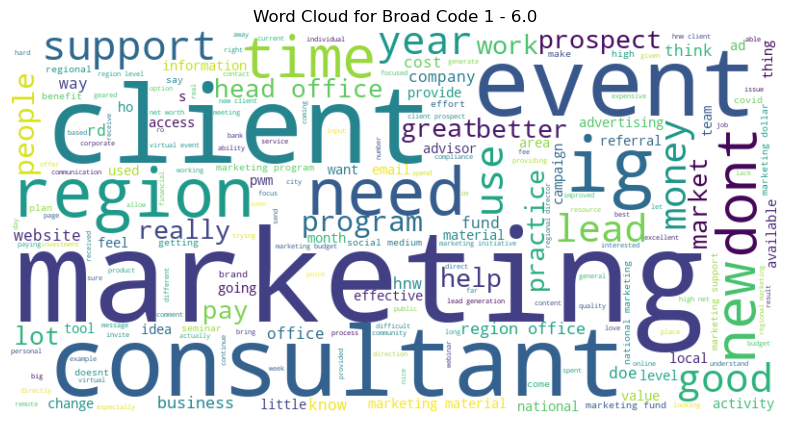

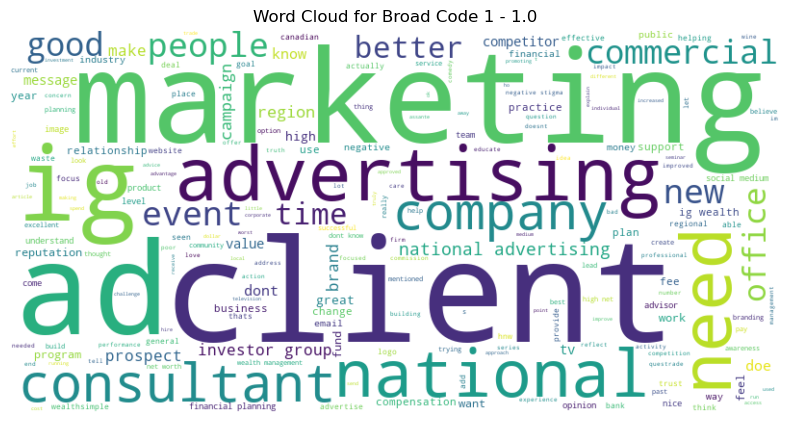

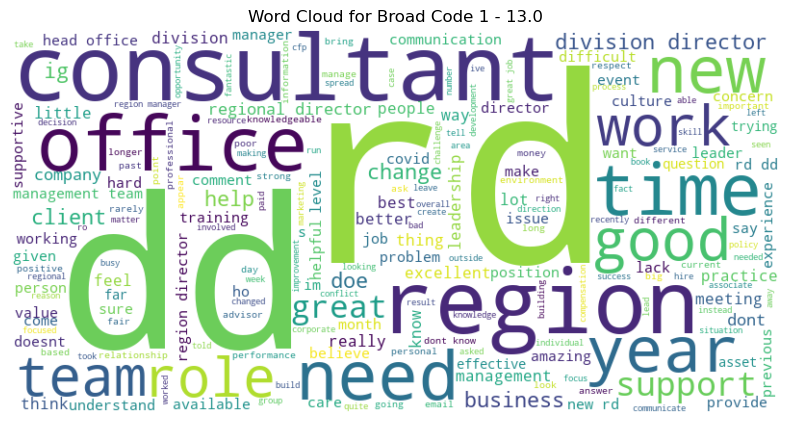

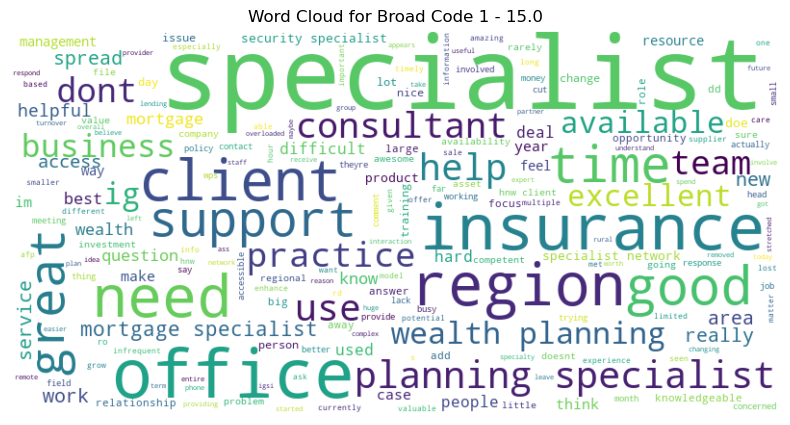

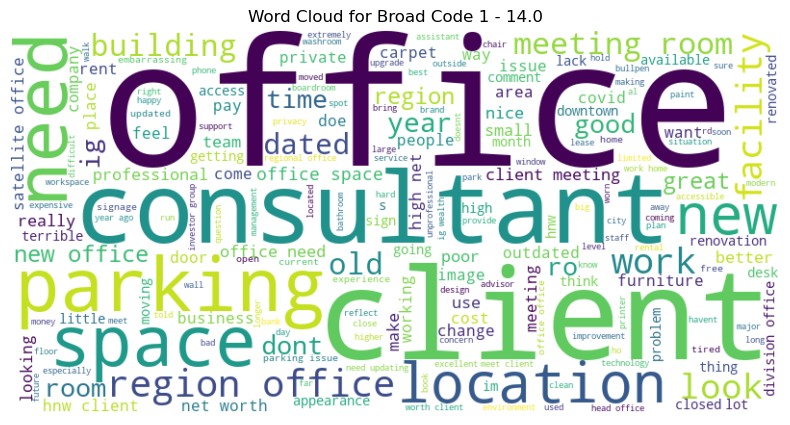

In [ ]:
# Generate word clouds for Broad Code 1
for broad_code in df['Broad Code 1'].unique():
    text = ' '.join(df[df['Broad Code 1'] == broad_code]['Comment'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Broad Code 1 - {broad_code}')
    plt.axis('off')
    plt.show()

# Step 4: Prepare Data for Model

In [ ]:
# Combine 'tab name' and 'Comment' into a single feature
df['text'] = df['tab name'] + ' ' + df['Comment']

# Split the data into features and target
X = df['text']
y_broad_code = df['Broad Code 1']
y_sub_code = df['Sub Code 1']

#Tokenization by using BOW - TF-IDF
tfidf_vectorizer = TfidfVectorizer(
    # ignore terms that appear in less than 1% of the documents".
    min_df=.01,
    # ignore terms that appear in more than 95% of the documents
    max_df=.95,
    ngram_range=(1,5))
%time dtm_tfidf = tfidf_vectorizer.fit_transform(X)

bow_df_tfidf = pd.DataFrame(dtm_tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out(), index=X.index)

vectorizer_cleaned_df = pd.concat([y_broad_code, y_sub_code, X, bow_df_tfidf], axis=1)
vectorizer_cleaned_df.drop(columns=['text'], inplace=True)
print(vectorizer_cleaned_df.shape)
vectorizer_cleaned_df.head()


CPU times: user 1.85 s, sys: 164 ms, total: 2.01 s
Wall time: 2.16 s
(16784, 297)


,Broad Code 1,Sub Code 1,ability,able,access,account,actually,admin,advantage,advantage plus,...,value,wait,want,way,wealth,week,work,working,worth,year
0,4.0,422.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
11,4.0,442.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
12,4.0,422.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.242195,0.162344,0.0,0.0,0.0
16,17.0,1700.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
19,5.0,503.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.305554,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0


In [ ]:
# Export the result_df to an Excel file
output_file_path = 'Output/vectorizer_cleaned_df.xlsx'
vectorizer_cleaned_df.to_excel(output_file_path, index=False)

# Step 5: Shallow ML Models - Multi Label Classifcation

### 5.1 - Split the data into training and validation sets

In [ ]:
# Split the data into features and target
X = vectorizer_cleaned_df.drop(columns=['Broad Code 1', 'Sub Code 1'])
y = vectorizer_cleaned_df[['Broad Code 1', 'Sub Code 1']]

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

### 5.2 - Defining different models and Assessing models to find the best one

In [ ]:
# Define the models
models = {
    'RandomForest': RandomForestClassifier(random_state=42),
    'GradientBoosting': GradientBoostingClassifier(random_state=42),
    'LogisticRegression': LogisticRegression(max_iter=1000, random_state=42),
    'KNeighbors': KNeighborsClassifier()
}

# Function to create a pipeline and evaluate a model
def create_pipeline_and_evaluate(model_name, model):
    pipeline = Pipeline([
        ('classifier', MultiOutputClassifier(model))
    ])

    # Train the model on the training data
    pipeline.fit(X_train, y_train)

    # Make predictions on the validation data
    y_pred = pipeline.predict(X_val)

    # Evaluate the model
    print(f"Evaluation for Broad Code 1 with {model_name}:")
    print(f"Accuracy: {accuracy_score(y_val['Broad Code 1'], y_pred[:, 0])}")
    f1 = f1_score(y_val['Broad Code 1'], y_pred[:, 0], average='weighted')
    print(f'F1 Score for {model_name}: {f1}')
    print(classification_report(y_val['Broad Code 1'], y_pred[:, 0]))
    print("\n")

    print(f"Evaluation for Sub Code 1 with {model_name}:")
    print(f"Accuracy: {accuracy_score(y_val['Sub Code 1'], y_pred[:, 1])}")
    f1 = f1_score(y_val['Sub Code 1'], y_pred[:, 1], average='weighted')
    print(f'F1 Score for {model_name}: {f1}')
    print(classification_report(y_val['Sub Code 1'], y_pred[:, 1]))
    print("\n")

    return pipeline

In [ ]:
# Evaluate each model
pipelines = {}
for model_name, model in models.items():
    print(f"Evaluating model: {model_name}")
    pipelines[model_name] = create_pipeline_and_evaluate(model_name, model)

Evaluating model: RandomForest
Evaluation for Broad Code 1 with RandomForest:
Accuracy: 0.8562351072279587
F1 Score for RandomForest: 0.8412554781578991
              precision    recall  f1-score   support

         1.0       0.80      0.09      0.16        45
         2.0       0.54      0.50      0.52       177
         3.0       0.00      0.00      0.00         8
         4.0       0.81      0.93      0.86       428
         5.0       0.92      0.93      0.92       651
         6.0       0.85      0.97      0.91       285
         7.0       0.79      0.75      0.77       212
         8.0       0.92      0.86      0.89       337
         9.0       0.66      0.77      0.71       168
        10.0       0.81      0.92      0.86       273
        11.0       0.99      0.97      0.98       285
        12.0       0.88      0.93      0.90       488
        13.0       0.91      0.98      0.95       321
        14.0       0.99      0.99      0.99       311
        15.0       0.72      0.68   

In [ ]:
# Select the best pipeline - LogisticRegression for final prediction
final_pipeline = pipelines['LogisticRegression']

# Train the selected model on the entire dataset
final_pipeline.fit(X, y)

# Make predictions on the entire dataset
predictions = final_pipeline.predict(X)
df['Predicted Broad Code 1'] = predictions[:, 0]
df['Predicted Sub Code 1'] = predictions[:, 1]

### 5.3 - Export the final predicted df to a new Excel file

In [ ]:
output_file_path = 'Output/predicted_traditional_output.xlsx'
df[['tab name', 'Comment', 'Broad Code 1', 'Sub Code 1', 'Predicted Broad Code 1', 'Predicted Sub Code 1']].to_excel(output_file_path, index=False)
print(f"The DataFrame has been exported to {output_file_path}")

The DataFrame has been exported to Output/predicted_traditional_output.xlsx


# Step 6: Deep Learning - Multi Label Classifcation

In [ ]:
file_path = 'OUtput/cleaned_df.xlsx'
cleaned_df = pd.ExcelFile(file_path)
data_frames = []

for sheet in cleaned_df.sheet_names:
    df = pd.read_excel(file_path, sheet_name=sheet)
    data_frames.append(df)

cleaned_df = pd.concat(data_frames, ignore_index=True)
cleaned_df['text'] = cleaned_df['tab name'].fillna('') + ' ' + cleaned_df['Comment'].fillna('')

# Split the data into features and targets
X = cleaned_df['text'].values
y_broad = cleaned_df['Broad Code 1'].values
y_sub = cleaned_df['Sub Code 1'].values

In [ ]:
# Encode the target labels
label_encoder_broad = LabelEncoder()
label_encoder_sub = LabelEncoder()

y_broad = label_encoder_broad.fit_transform(y_broad)
y_sub = label_encoder_sub.fit_transform(y_sub)

# Tokenize and pad the text data
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)
X_seq = tokenizer.texts_to_sequences(X)
X_padded = pad_sequences(X_seq, padding='post')

# Split the data into training and validation sets
X_train, X_val, y_train_broad, y_val_broad, y_train_sub, y_val_sub = train_test_split(
    X_padded, y_broad, y_sub, test_size=0.2, random_state=42
)

# Define the model
vocab_size = len(tokenizer.word_index) + 1
embedding_dim = 100

input_text = Input(shape=(X_padded.shape[1],))
embedding = Embedding(vocab_size, embedding_dim)(input_text)
x = GlobalAveragePooling1D()(embedding)

# Output layers
output_broad = Dense(len(np.unique(y_broad)), activation='softmax', name='broad_output')(x)
output_sub = Dense(len(np.unique(y_sub)), activation='softmax', name='sub_output')(x)

model = Model(inputs=input_text, outputs=[output_broad, output_sub])
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    X_train, {'broad_output': y_train_broad, 'sub_output': y_train_sub},
    epochs=10, batch_size=32, validation_data=(X_val, {'broad_output': y_val_broad, 'sub_output': y_val_sub})
)

Epoch 1/10
420/420 [==============================] - 6s 12ms/step - loss: 8.1514 - broad_output_loss: 2.9459 - sub_output_loss: 5.2056 - broad_output_accuracy: 0.1237 - sub_output_accuracy: 0.0454 - val_loss: 7.8893 - val_broad_output_loss: 2.8799 - val_sub_output_loss: 5.0094 - val_broad_output_accuracy: 0.1311 - val_sub_output_accuracy: 0.0357
Epoch 2/10
420/420 [==============================] - 4s 11ms/step - loss: 7.8295 - broad_output_loss: 2.8620 - sub_output_loss: 4.9675 - broad_output_accuracy: 0.1306 - sub_output_accuracy: 0.0469 - val_loss: 7.8534 - val_broad_output_loss: 2.8490 - val_sub_output_loss: 5.0043 - val_broad_output_accuracy: 0.1329 - val_sub_output_accuracy: 0.0363
Epoch 3/10
420/420 [==============================] - 4s 10ms/step - loss: 7.7805 - broad_output_loss: 2.8255 - sub_output_loss: 4.9550 - broad_output_accuracy: 0.1405 - sub_output_accuracy: 0.0497 - val_loss: 7.7984 - val_broad_output_loss: 2.8043 - val_sub_output_loss: 4.9942 - val_broad_output_accu

In [ ]:
# Evaluate the model
y_broad_pred, y_sub_pred = model.predict(X_val)
y_broad_pred = np.argmax(y_broad_pred, axis=1)
y_sub_pred = np.argmax(y_sub_pred, axis=1)

print("Evaluation for Broad Code 1:")
print(f"Accuracy: {accuracy_score(y_val_broad, y_broad_pred)}")
f1 = f1_score(y_val_broad, y_broad_pred, average='weighted')
print(f'F1 Score for Deep Learning Model: {f1}')
print(classification_report(y_val_broad, y_broad_pred))
print('\n')

print("Evaluation for Sub Code 1:")
print(f"Accuracy: {accuracy_score(y_val_sub, y_sub_pred)}")
f1 = f1_score(y_val_sub, y_sub_pred, average='weighted')
print(f'F1 Score for Deep Learning Model: {f1}')
print(classification_report(y_val_sub, y_sub_pred))

105/105 [==============================] - 0s 1ms/step
Evaluation for Broad Code 1:
Accuracy: 0.7253500148942508
F1 Score for Deep Learning Model: 0.6638584598816077
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        29
           1       0.00      0.00      0.00       117
           2       0.00      0.00      0.00         5
           3       0.59      0.95      0.73       281
           4       0.58      0.98      0.73       436
           5       0.88      0.95      0.91       192
           6       0.00      0.00      0.00       137
           7       0.86      0.76      0.81       220
           8       0.56      0.27      0.37       110
           9       0.69      0.49      0.57       177
          10       0.99      0.77      0.86       190
          11       0.68      0.99      0.81       319
          12       0.89      0.97      0.93       232
          13       0.97      0.97      0.97       214
          14       0.00

In [ ]:
# Make predictions on the entire dataset
y_broad_pred_all, y_sub_pred_all = model.predict(X_padded)
df['Predicted Broad Code 1'] = label_encoder_broad.inverse_transform(np.argmax(y_broad_pred_all, axis=1))
df['Predicted Sub Code 1'] = label_encoder_sub.inverse_transform(np.argmax(y_sub_pred_all, axis=1))

# Export the DataFrame to a new Excel file
output_file_path = 'Output/predicted_deeplearning_output.xlsx'
df[['tab name', 'Comment', 'Broad Code 1', 'Sub Code 1', 'Predicted Broad Code 1', 'Predicted Sub Code 1']].to_excel(output_file_path, index=False)
print(f"The DataFrame has been exported to {output_file_path}")

525/525 [==============================] - 1s 1ms/step
The DataFrame has been exported to Output/predicted_deeplearning_output.xlsx


# ----END----